# Visualising atlas mapping

In [1]:
# Load packages
suppressPackageStartupMessages({
    library(Seurat)
    library(scran)
    library(scater)
    library(batchelor)
    library(SingleCellExperiment)
    library(scater)
    library(Matrix)
    library(reshape2)
    library(data.table)
    library(BiocParallel)
    library(dplyr)
    library(gridExtra)
})

    ncores = 4
    mcparam = MulticoreParam(workers = ncores)
    register(mcparam)
    BPPARAM = SerialParam()

options(repr.plot.width=15, repr.plot.height=8)

In [2]:
main = "/rds/project/rds-SDzz0CATGms/users/bt392/01_Eomes_RNA/"
out_dir = paste0(main, '07_atlas_mapping/')
plot_dir = paste0(main, '07_atlas_mapping/plots/')
dir.create(out_dir, showWarnings = FALSE)
dir.create(plot_dir, showWarnings = FALSE)

source(paste0(main, "mapping_functions.R"))
atlas_in = '/rds/project/rds-SDzz0CATGms/users/bt392/mouse/Mixl1_KO/atlas/atlas/'

In [3]:
mappings = read.csv(paste0(out_dir,"mapped.csv"))

In [4]:
load_data(normalise=TRUE)
sce_query = sce[Matrix::rowSums(counts(sce)) > 0,]
meta_query = meta

In [5]:
meta_complete = merge(meta, mappings, by='cell')

In [6]:
meta_complete$umap_1 = as.numeric(meta_complete$umap_1)
meta_complete$umap_2 = as.numeric(meta_complete$umap_2)

In [8]:
head(meta_complete)

,cell,barcode,stage,batch,Sample_name,batch_name,tdTom,index,sample,doub.density,doublet,stripped,umap_1,umap_2,louvain_cluster,celltype.mapped,stage.mapped,closest.cell,celltype.score,cellstage.score
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,cell_1,AAACCCAGTTCTCTAT,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,1,3,13.9251218125,FALSE,FALSE,3.010126,2.465241,7,Rostral neurectoderm,E7.75,cell_51859,1.0000000,0.4333333
2,cell_10,AACCTGACAGCTATAC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,10,3,8.99037441322314,FALSE,FALSE,1.778136,2.546702,7,Forebrain/Midbrain/Hindbrain,E8.25,cell_21468,0.6333333,0.5000000
3,cell_100,AGACAGGTCACCATCC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,100,3,8.1733,FALSE,FALSE,2.045629,3.200361,7,Rostral neurectoderm,E8.25,cell_95187,0.6000000,0.4000000
4,cell_1000,ACCGTTCAGCGGTAGT,E8.5,8,MLT_C7-,SLX-20795_SITTA12_HKTG2DRXY,negative,1000,8,3.255233113125,FALSE,FALSE,19.594309,3.510897,12,Erythroid1,E8.0,cell_30787,1.0000000,0.4333333
5,cell_10000,TTGTTGTTCAGAGTTC,E8.5,4,MLT_G9 Tom-,SLX-20795_SITTB11_HKTG2DRXY,negative,10000,4,3.24195281211701,FALSE,FALSE,17.977837,4.434144,12,Erythroid1,E8.25,cell_69601,0.7333333,0.5333333
6,cell_10001,TTGTTTGAGACAACAT,E8.5,4,MLT_G9 Tom-,SLX-20795_SITTB11_HKTG2DRXY,negative,10001,4,6.35586945213912,FALSE,FALSE,11.613280,-3.233900,14,ExE ectoderm,E7.75,cell_18825,1.0000000,0.5666667


### Project on atlas UMAP

In [9]:
# plot original atlas projection to make comprehensible
atlas_meta = read.table(paste0(atlas_in, 'meta.tab'), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
atlas_meta = atlas_meta[atlas_meta$doublet==FALSE & atlas_meta$stripped==FALSE,]
atlas_umap <- atlas_meta[, c('cell', 'umapX', 'umapY')]
colnames(atlas_umap) <- c('closest.cell', 'umapX.mapped', 'umapY.mapped')
meta_complete <- merge(meta_complete, atlas_umap, by='closest.cell', all.x=TRUE)[, union(names(meta_complete), names(atlas_umap))] # last part just to keep column order
meta_complete = meta_complete[order(meta_complete$index),]

In [10]:
head(meta_complete)

,cell,barcode,stage,batch,Sample_name,batch_name,tdTom,index,sample,doub.density,...,umap_1,umap_2,louvain_cluster,celltype.mapped,stage.mapped,closest.cell,celltype.score,cellstage.score,umapX.mapped,umapY.mapped
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,...,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
17246,cell_1,AAACCCAGTTCTCTAT,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,1,3,13.9251218125,...,3.010126,2.465241,7,Rostral neurectoderm,E7.75,cell_51859,1.0000000,0.4333333,-5.2564626,-4.2838732
1705,cell_2,AAACGCTAGTGATTCC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,2,3,17.2720353798127,...,4.665354,10.294800,17,Intermediate mesoderm,E8.0,cell_115740,1.0000000,0.5666667,0.6875476,2.9155428
26876,cell_3,AAACGCTCATGACTCA,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,3,3,10.7818835555556,...,13.557626,11.076644,18,Allantois,E8.25,cell_97180,0.6666667,0.4000000,-5.2710172,7.4179729
25773,cell_4,AAAGGGCAGTCATGAA,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,4,3,11.1007909421488,...,4.816841,1.185376,3,Surface ectoderm,E8.25,cell_94414,0.9333333,0.5666667,-4.9166040,-7.7070684
12901,cell_6,AAAGTGAAGTGTAGAT,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,6,3,16.5111062820227,...,1.348813,11.754560,5,Caudal Mesoderm,E8.0,cell_24872,1.0000000,0.6666667,0.2513691,0.4679399
20739,cell_7,AACAACCTCCTTATAC,E8.5,3,MLT_G9 Tom+,SLX-20795_SITTA11_HKTG2DRXY,positive,7,3,0,...,7.157091,11.931658,8,Intermediate mesoderm,E8.0,cell_70126,0.8666667,0.5000000,-0.7896198,4.7712991


In [11]:
meta_complete = meta_complete[order(meta_complete$index),]
write.csv(meta_complete, file =  paste0(out_dir,"meta_complete.csv"),row.names=FALSE)

In [12]:
# Plot projected UMAP

p1 = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) + 
    geom_point(alpha = 0.5, size = 0.15) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    labs(title = "Extended atlas UMAP",
    subtitle = "Celltypes") +
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 5)) +
    scale_colour_manual(values = celltype_colours, name = "celltype") + 
    theme_bw()
p1_legend = cowplot::get_legend(legend_plot)

p2 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype.mapped)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size = 0.7) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    labs(title = "Eomes projected UMAP",
    subtitle = "Mapped Celltypes") + 
    umap_theme


p3 = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) + 
    geom_point(alpha = 0.5, size = 0.15) + 
    scale_colour_manual(values = stage_colours, name = "celltype") +
    labs(title = "",
    subtitle = "Stages") +
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 1)) +
    scale_colour_manual(values = stage_colours, name = "stage") + 
    theme_bw() + theme(text = element_text(size = 15))
p3_legend = cowplot::get_legend(legend_plot)

p4 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=stage.mapped)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours, name = "Stage") +
    labs(title = "",
    subtitle = "Mapped stages") + 
    umap_theme

### Mapping quantification three columns 
p5 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype.score)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
  #  scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "Mapping scores",
    subtitle = "Celltype score") + 
    umap_theme

p6 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=cellstage.score)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
  #  scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Stage score") + 
    umap_theme

p7 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=tdTom)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.4, size =  0.7) + 
    scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
    ggtitle('Tomato') +
    umap_theme


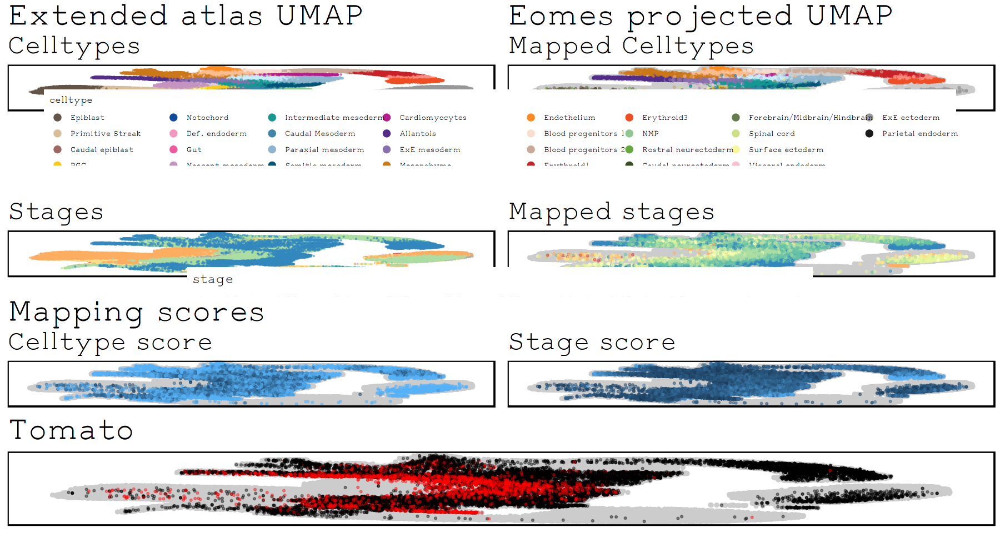

In [13]:
grid.arrange(arrangeGrob(p1, p2, ncol = 2), p1_legend,
            arrangeGrob(p3, p4, ncol = 2), p3_legend,
            arrangeGrob(p5, p6, ncol = 2),
            p7, ncol = 1, heights = c(1, 0.4, 1, 0.1, 1, 1))

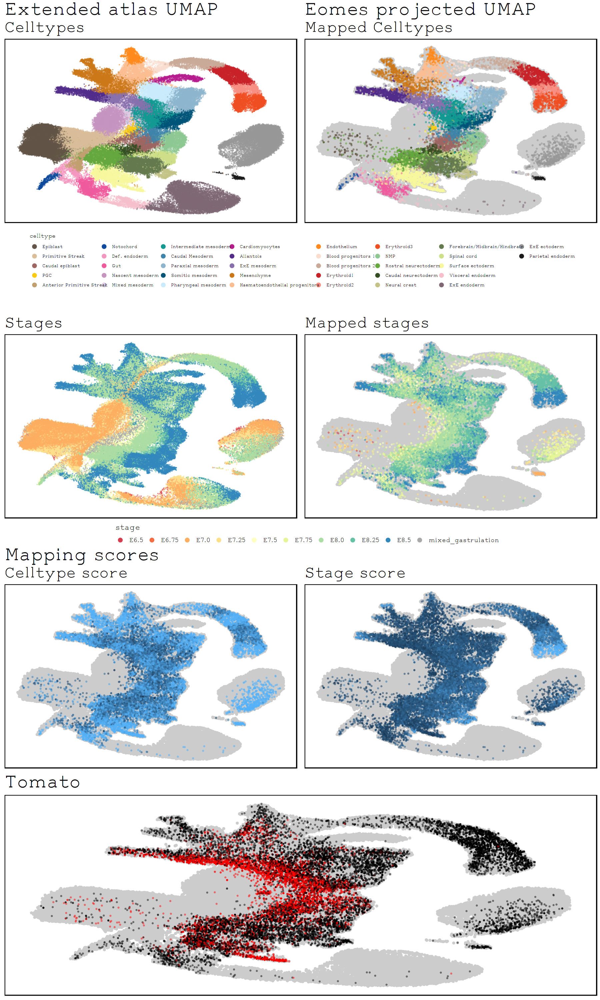

In [14]:
options(repr.plot.width=15, repr.plot.height=25)

p = grid.arrange(arrangeGrob(p1, p2, ncol = 2), p1_legend,
            arrangeGrob(p3, p4, ncol = 2), p3_legend,
            arrangeGrob(p5, p6, ncol = 2),
            p7, ncol = 1, heights = c(1, 0.3, 1, 0.1, 1, 1))
ggsave(paste(plot_dir, 'Atlas_projected.png'), p, device='png', width=15, height=25)

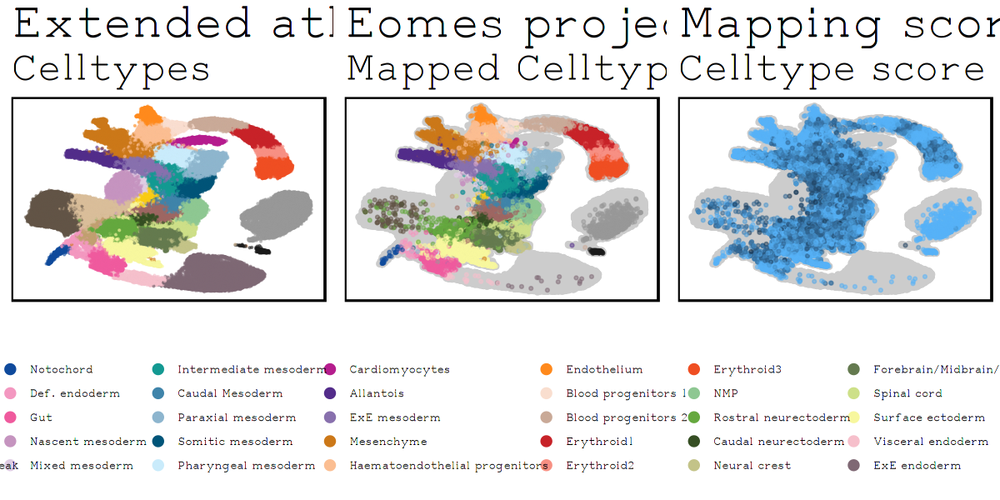

In [15]:
options(repr.plot.width=10, repr.plot.height=5)

p = grid.arrange(arrangeGrob(p1, p2, p5, ncol = 3), p1_legend,
                 ncol = 1, heights = c(1, 0.6))
ggsave(paste(plot_dir, 'Atlas_projected_celltypes.png'), p, device='png', width=20, height=10)

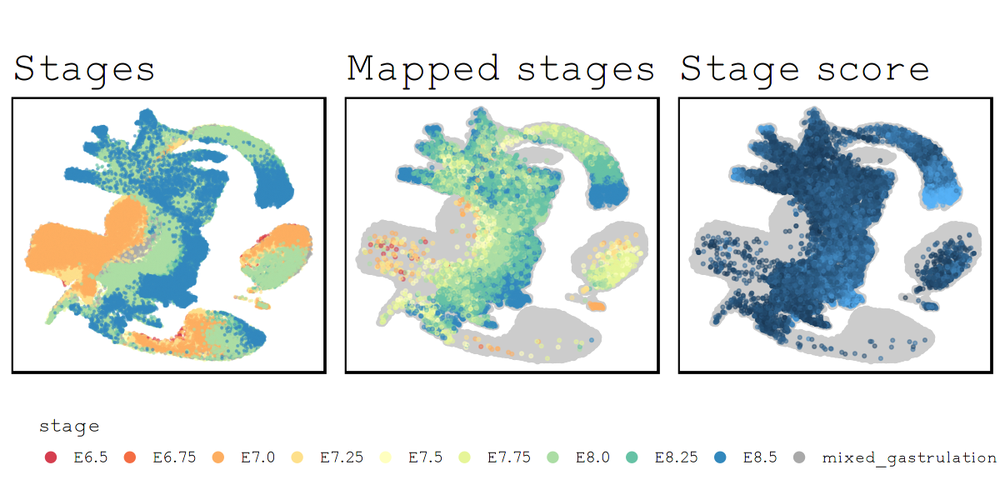

In [16]:
p = grid.arrange(arrangeGrob(p3, p4, p6, ncol = 3), p3_legend,
                 ncol = 1, heights = c(1, 0.3))
ggsave(paste(plot_dir, 'Atlas_projected_stages.png'), p, device='png', width=20, height=10)

In [27]:
p = p7
ggsave(paste(plot_dir, 'Atlas_projected_tomato.png'), p, device='png', width=15, height=10)

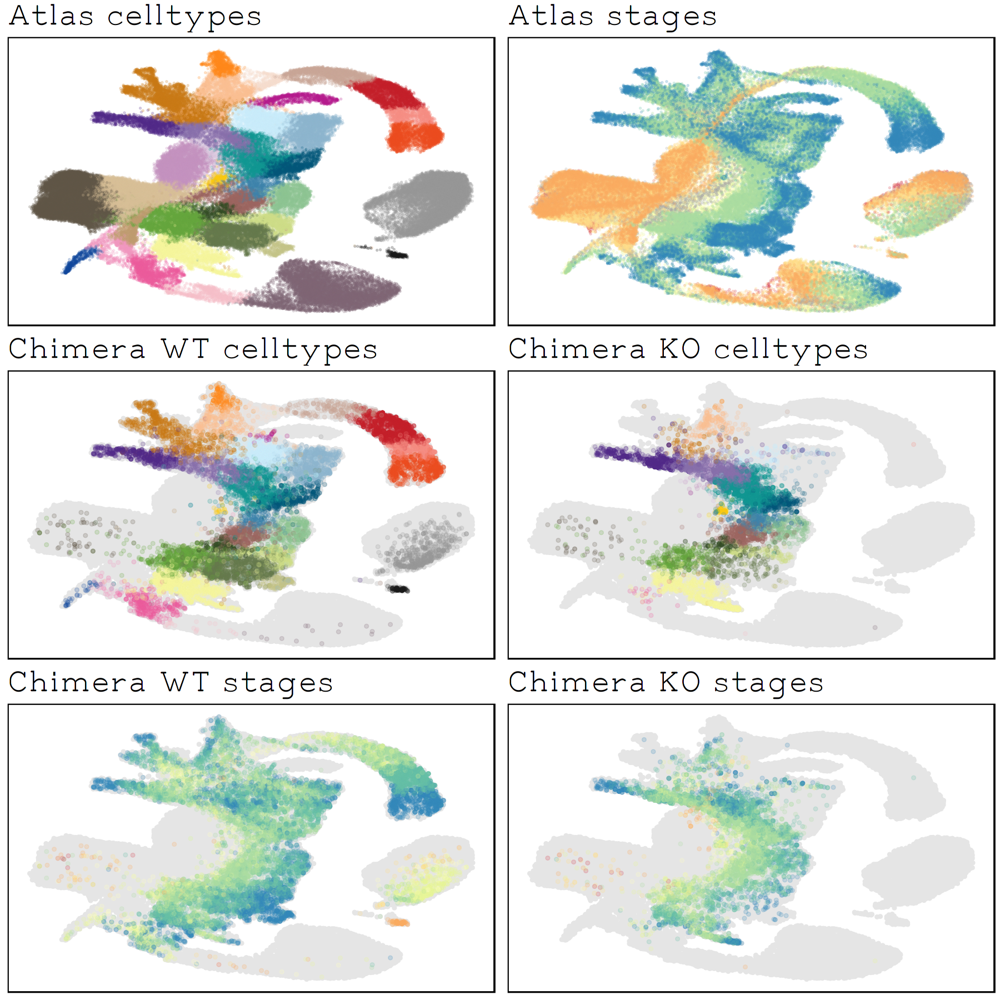

In [18]:
p1 = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) + 
    geom_point(alpha=0.2, size = 0.5) + 
    ggtitle('Atlas celltypes') + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    umap_theme

p2 = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) + 
    geom_point(alpha=0.2, size = 0.5) + 
    ggtitle('Atlas stages') + 
    scale_colour_manual(values = stage_colours, name = "Stage") +
    umap_theme

p3 = ggplot(meta_complete[meta_complete$tdTom=='negative',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='negative',]$celltype.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera WT celltypes') + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    umap_theme

p4 = ggplot(meta_complete[meta_complete$tdTom=='positive',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='positive',]$celltype.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera KO celltypes') + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    umap_theme

p5 = ggplot(meta_complete[meta_complete$tdTom=='negative',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='negative',]$stage.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera WT stages') + 
    scale_colour_manual(values = stage_colours, name = "Stage") +
    umap_theme

p6 = ggplot(meta_complete[meta_complete$tdTom=='positive',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='positive',]$stage.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera KO stages') + 
    scale_colour_manual(values = stage_colours, name = "Stage") +
    umap_theme

options(repr.plot.width=15, repr.plot.height=15)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol=2)

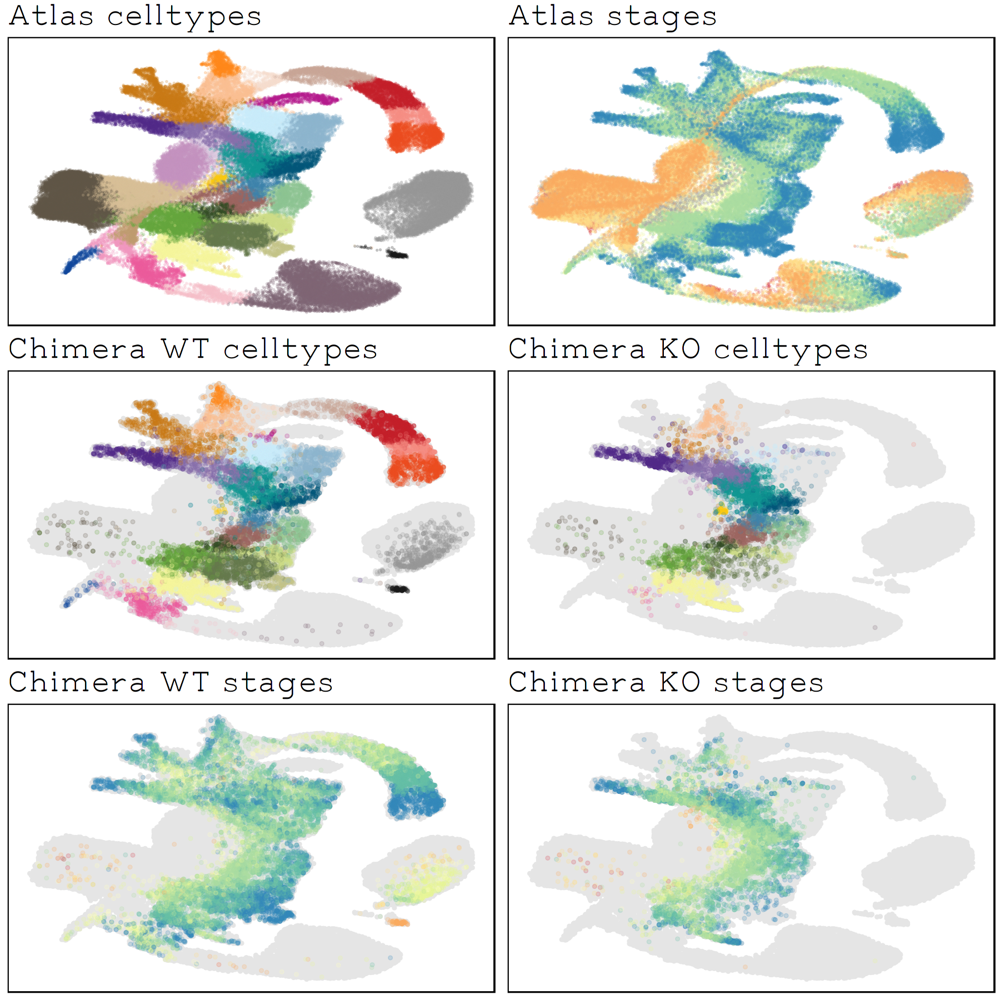

In [19]:
ggsave(paste0(plot_dir, 'Atlas_projection_KO_WT.png'), 
       plot = grid.arrange(p1, p2, p3, p4, p5, p6, ncol=2), 
       device = 'png',
       width = 12,
       height = 15,
       dpi = 300)

### Plotting on Chim only UMAP

In [30]:
# Plotting of Stat3 UMAP
p1 = ggplot(meta_complete, aes(umap_1, umap_2, col=tdTom)) +
    geom_point(alpha = 0.4, size =  0.7) + 
    scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
    ggtitle('Tomato') +
    umap_theme

p2 = ggplot(meta_complete, aes(umap_1, umap_2, col=celltype.mapped)) +
    geom_point(alpha = 0.5, size = 0.7) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    labs(title = "Chim UMAP",
    subtitle = "Celltype") + 
    umap_theme

legend_plot = ggplot(meta_complete, aes(umap_1, umap_2, col=celltype.mapped)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 5)) +
    scale_colour_manual(values = celltype_colours, name = "celltype") + 
    theme_bw()
p2_legend = cowplot::get_legend(legend_plot)

p3 = ggplot(meta_complete, aes(umap_1, umap_2, col=stage.mapped)) + 
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours, name = "Stage") +
    labs(title = "",
    subtitle = "Mapped stages") + 
    umap_theme

legend_plot = ggplot(meta_complete, aes(umap_1, umap_2, col=stage.mapped)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 1)) +
    scale_colour_manual(values = stage_colours, name = "stage") + 
    theme_bw() + theme(text = element_text(size = 15))
p3_legend = cowplot::get_legend(legend_plot)


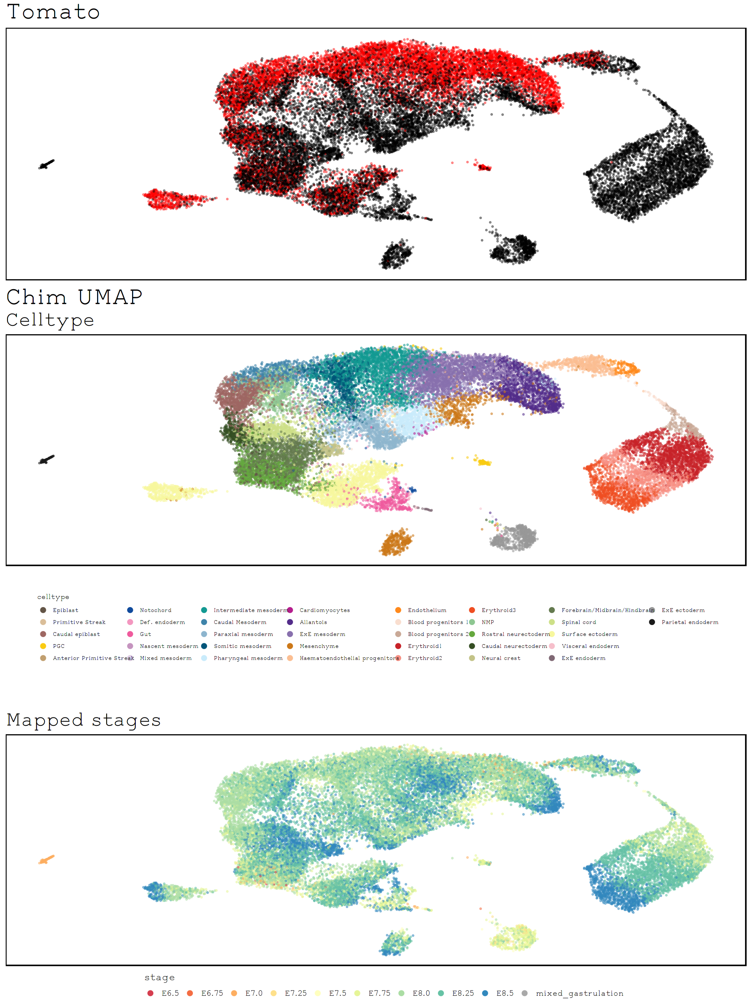

In [31]:
options(repr.plot.width=15, repr.plot.height=20)

p = grid.arrange(p1,
                p2, p2_legend,
                p3, p3_legend,
                 ncol = 1, heights = c(1, 1, 0.4 ,1 ,0.1))
ggsave(paste(plot_dir, 'Chim_umaps.png'), p, device='png', width=10, height=20)